# Imports

In [ ]:
!pip install --upgrade pyalgotrading

In [1]:
from pyalgotrading.algobulls import AlgoBullsConnection

# Connection

In [2]:
connection = AlgoBullsConnection()

In [3]:
connection.get_token_url()

Please login to this URL to get your unique token: https://app.algobulls.com/settings?section=developerOptions


In [4]:
API_TOKEN = "33018c2bbd554247ef271b945a42450a46bd6b8f"
connection.set_access_token(API_TOKEN)

# Strategy Creation

## Import Strategy from pyaglostrategypool

In [ ]:
! wget -O options_bull_call_ladder.py https://raw.githubusercontent.com/algobulls/pyalgostrategypool/master/pyalgostrategypool/options_bull_call_ladder.py
! sed -i '1s/^/from pyalgotrading.strategy import StrategyBase\n/' options_bull_call_ladder.py

In [5]:
from options_bull_call_ladder import StrategyOptionsBullCallLadder as strategy_cls

In [6]:
response = connection.create_strategy(strategy_cls, overwrite=True)
response

{'message': 'Strategy saved successfully',
 'cstcId': 130238,
 'strategyId': '71a00aeb17ea4bd28ac5a3c3766daad9'}

In [7]:
strategy = response['strategyId']

# Strategy Testing

## Instruments Searching (optional)

In [8]:
instrument = connection.search_instrument('NIFTY 50', exchange='NSE')
instrument

[{'id': 61576, 'value': 'NSE:NIFTY 50'}]

## Setup Parameters

In [9]:
parameters = {
    'LEG_ONE_NUMBER_OF_STRIKES': 0,
    'LEG_ONE_STRIKE_DIRECTION': 1,
    'LEG_ONE_TRADING_SYMBOL_SUFFIX': 1,
    'LEG_ONE_TRANSACTION_TYPE': 1,
    
    'LEG_THREE_NUMBER_OF_STRIKES': 4,
    'LEG_THREE_STRIKE_DIRECTION': 2,
    'LEG_THREE_TRADING_SYMBOL_SUFFIX': 1,
    'LEG_THREE_TRANSACTION_TYPE': 2,
    
    'LEG_TWO_NUMBER_OF_STRIKES': 2,
    'LEG_TWO_STRIKE_DIRECTION': 2,
    'LEG_TWO_TRADING_SYMBOL_SUFFIX': 1,
    'LEG_TWO_TRANSACTION_TYPE': 1
}

In [10]:
initial_virtual_funds = 1450000     # in Rupees

## Backtesting

### Start

In [11]:
connection.backtest(
    strategy=strategy, 
    start='2021-08-01 09:15 +0530', 
    end='2023-07-31 15:30 +0530',  
    instrument='NSE:NIFTY 50', 
    lots=10,
    parameters=parameters, 
    candle='1 hour',
    initial_funds_virtual=initial_virtual_funds

)


Starting the strategy 'Options Bull Call Ladder Template' in BACKTESTING mode...
╒═════════════════════════╤════════════════════════════════════════╕
│ Config                  │ Value                                  │
╞═════════════════════════╪════════════════════════════════════════╡
│ Strategy Name           │ Options Bull Call Ladder Template      │
├─────────────────────────┼────────────────────────────────────────┤
│ Trading Type            │ BACKTESTING                            │
├─────────────────────────┼────────────────────────────────────────┤
│ Instrument(s)           │ ['NSE:NIFTY 50']                       │
├─────────────────────────┼────────────────────────────────────────┤
│ Quantity/Lots           │ 10                                     │
├─────────────────────────┼────────────────────────────────────────┤
│ Start Timestamp         │ 2021-08-01 09:15:00+05:30              │
├─────────────────────────┼────────────────────────────────────────┤
│ End Timestamp      

### Status

In [12]:
connection.get_backtesting_job_status(strategy)

{'message': 'STARTING', 'status': 1}

### Logs

In [14]:
logs = connection.get_backtesting_logs(strategy)

In [15]:
print(logs)

[2023-08-24 20:00:43] Performing sanity checks on cfg strategy_parameters, setting up required data structures...
[2023-08-24 20:00:43] Sanity checks on cfg successful.
[2023-08-24 20:00:43] Currency set to "INR"
[2023-08-24 20:00:43] Setting up broker connection...
[2023-08-24 20:00:45] Broker connection has been setup successfully.
[2023-08-24 20:00:45] (NSE_IDX) Funds available in client's ABVIRTUALBROKER account is : INR '1450000.00'
[2023-08-24 20:00:45] 
########################################
 INITIALIZING ALGOBULLS CORE (v3.3.0)... 
########################################
[2023-08-24 20:00:45] Welcome ALGOBULLS VIRTUAL USER!
[2023-08-24 20:00:45] Reading strategy...
[2023-08-24 20:00:45] Entering Backtesting mode. Henceforth, all timestamps will be Backtesting timestamps...
[BT] [2021-08-01 09:15:00,000] [INFO] [tls] STARTING ALGOBULLS CORE...
[BT] [2021-08-01 09:15:00,000] [INFO] [tls] 
  #####  #######    #    ######  ####### ### #     #  #####     
 #     #    #      # #  

### Stop

In [16]:
connection.stop_backtesting_job(strategy)

Stopping BACKTESTING job... Success.


### Profit and Loss Reports

In [17]:
pnl_reports = connection.get_backtesting_report_pnl_table(strategy)
pnl_reports

,instrument_segment,instrument_tradingsymbol,entry_timestamp,entry_transaction_type,entry_quantity,entry_currency,entry_price,exit_timestamp,exit_transaction_type,exit_quantity,exit_currency,exit_price,pnl_absolute,pnl_cumulative_absolute
0,NFO,NIFTY05AUG2115950CE,2021-08-01 09:15:00+05:30,SELL,500,₹,15.00,2021-08-01 15:30:00+05:30,BUY,500,₹,15.00,0.0,0.0
1,NFO,NIFTY05AUG2115850CE,2021-08-01 09:15:00+05:30,BUY,500,₹,40.50,2021-08-01 15:30:00+05:30,SELL,500,₹,40.50,0.0,0.0
2,NFO,NIFTY05AUG2115750CE,2021-08-01 09:15:00+05:30,BUY,500,₹,88.95,2021-08-01 15:30:00+05:30,SELL,500,₹,88.95,0.0,0.0
3,NFO,NIFTY05AUG2116050CE,2021-08-02 09:15:00+05:30,SELL,500,₹,11.95,2021-08-02 15:30:00+05:30,BUY,500,₹,9.75,1100.0,1100.0
4,NFO,NIFTY05AUG2115950CE,2021-08-02 09:15:00+05:30,BUY,500,₹,28.00,2021-08-02 15:30:00+05:30,SELL,500,₹,33.60,2800.0,3900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,NFO,NIFTY03AUG2319750CE,2023-07-28 09:15:00+05:30,BUY,500,₹,100.00,2023-07-28 15:30:00+05:30,SELL,500,₹,59.55,-20225.0,-932950.0
1456,NFO,NIFTY03AUG2319650CE,2023-07-28 09:15:00+05:30,BUY,500,₹,170.05,2023-07-28 15:30:00+05:30,SELL,500,₹,105.25,-32400.0,-965350.0
1457,NFO,NIFTY03AUG2319850CE,2023-07-31 09:15:00+05:30,SELL,500,₹,31.80,2023-07-31 15:30:00+05:30,BUY,500,₹,31.80,0.0,-965350.0
1458,NFO,NIFTY03AUG2319750CE,2023-07-31 09:15:00+05:30,BUY,500,₹,59.55,2023-07-31 15:30:00+05:30,SELL,500,₹,59.55,0.0,-965350.0


### Statistics Reports

#### Statistics

In [18]:
connection.get_backtesting_report_statistics(strategy, initial_funds=initial_virtual_funds)

Generating Statistics for already fetched P&L data...


/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/pyalgotrading/algobulls/connection.py:482: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _returns_df['entry_timestamp'] = _returns_df['entry_timestamp'].dt.tz_localize(None)  # Note: Quantstats has a bug. It doesn't accept the df index, which is set below, with timezone. Hence, we have to drop the timezone info


                    Strategy
------------------  ----------
Start Period        2021-08-01
End Period          2023-07-31
Risk-Free Rate      0.0%
Time in Market      100.0%

Cumulative Return   -66.58%
CAGR﹪              -42.23%

Sharpe              -0.16
Prob. Sharpe Ratio  41.37%
Sortino             -0.27
Sortino/√2          -0.19
Omega               0.97

Max Drawdown        -84.6%
Longest DD Days     649

Gain/Pain Ratio     -0.03
Gain/Pain (1M)      -0.13

Payoff Ratio        1.43
Profit Factor       0.97
Common Sense Ratio  1.25
CPC Index           0.56
Tail Ratio          1.28
Outlier Win Ratio   3.73
Outlier Loss Ratio  3.25

MTD                 15.85%
3M                  19.02%
6M                  -38.35%
YTD                 -53.53%
1Y                  -56.89%
3Y (ann.)           -42.23%
5Y (ann.)           -42.23%
10Y (ann.)          -42.23%
All-time (ann.)     -42.23%

Avg. Drawdown       -11.77%
Avg. Drawdown Days  78
Recovery Factor     -0.79
Ulcer Index         0.49
Sere

#### Quantstats Full Report

Generating Statistics for already fetched P&L data...


/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/pyalgotrading/algobulls/connection.py:482: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _returns_df['entry_timestamp'] = _returns_df['entry_timestamp'].dt.tz_localize(None)  # Note: Quantstats has a bug. It doesn't accept the df index, which is set below, with timezone. Hence, we have to drop the timezone info


                           Strategy
-------------------------  ----------
Start Period               2021-08-01
End Period                 2023-07-31
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -66.58%
CAGR﹪                     -42.23%

Sharpe                     -0.16
Prob. Sharpe Ratio         41.37%
Smart Sharpe               -0.13
Sortino                    -0.27
Smart Sortino              -0.21
Sortino/√2                 -0.19
Smart Sortino/√2           -0.15
Omega                      0.97

Max Drawdown               -84.6%
Longest DD Days            649
Volatility (ann.)          93.56%
Calmar                     -0.5
Skew                       1.42
Kurtosis                   4.82

Expected Daily %           -0.22%
Expected Monthly %         -4.46%
Expected Yearly %          -30.6%
Kelly Criterion            -1.18%
Risk of Ruin               0.0%
Daily Value-at-Risk        -9.75%
Expected Shortfall (cVaR)  -9.75%

Max Consecutive

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2021-10-20,2023-03-31,2023-07-31,649,-84.598291,-82.721489
2,2021-09-27,2021-10-04,2021-10-18,21,-6.579352,-5.217090
3,2021-08-06,2021-08-13,2021-08-18,12,-4.782801,-4.744917
4,2021-09-08,2021-09-15,2021-09-17,9,-4.566621,-3.818222
5,2021-08-23,2021-08-27,2021-08-31,8,-2.481642,-2.085519


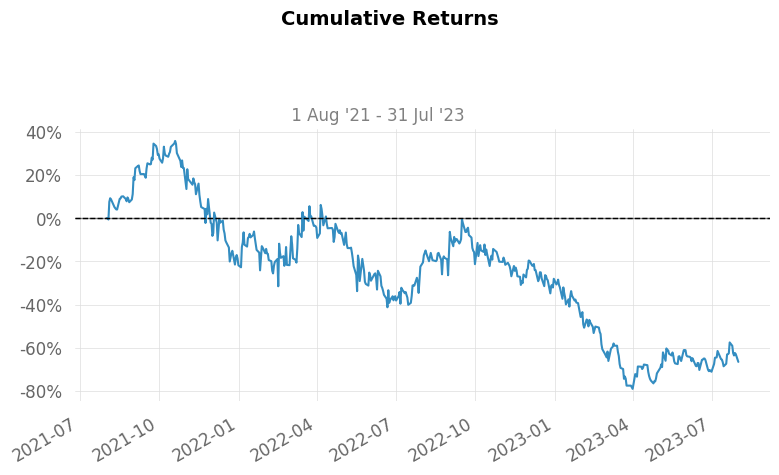

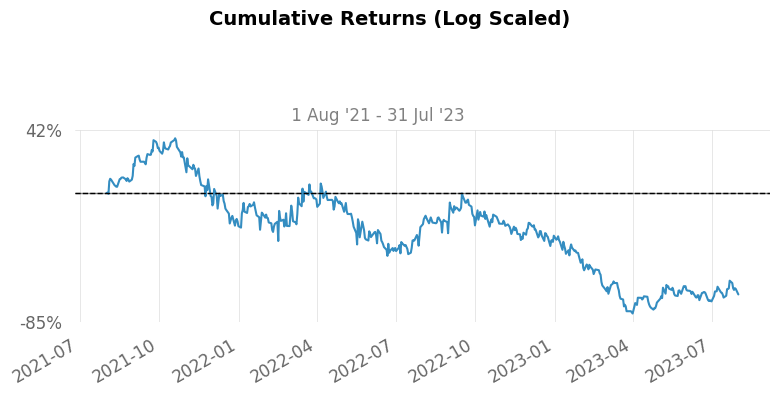

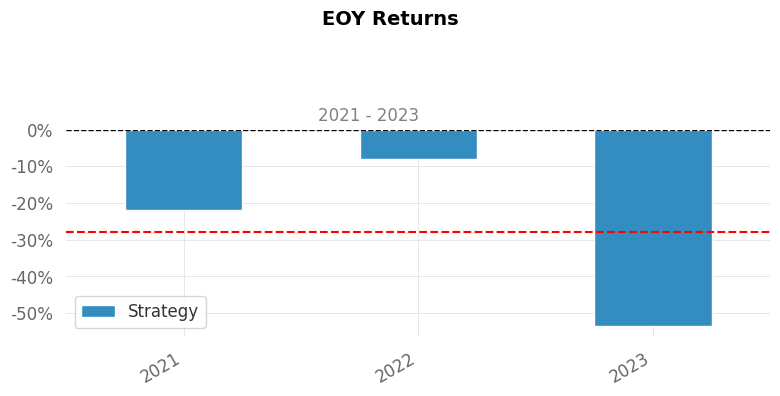

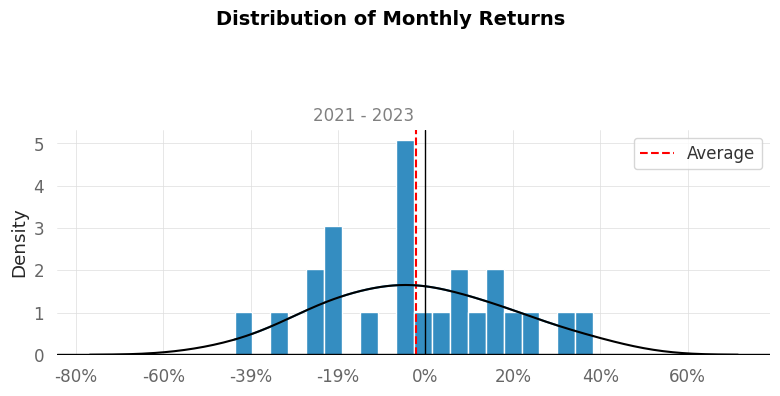

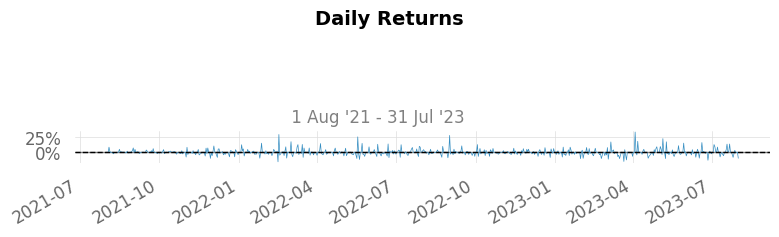

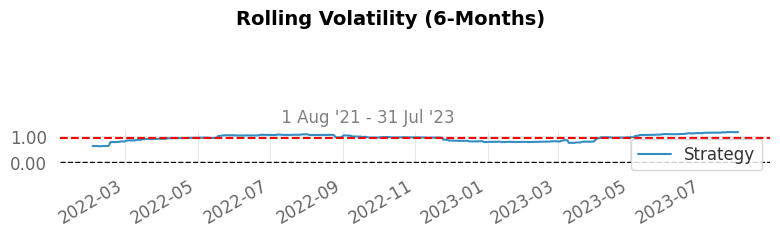

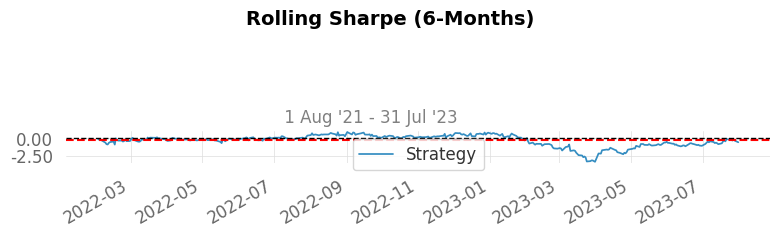

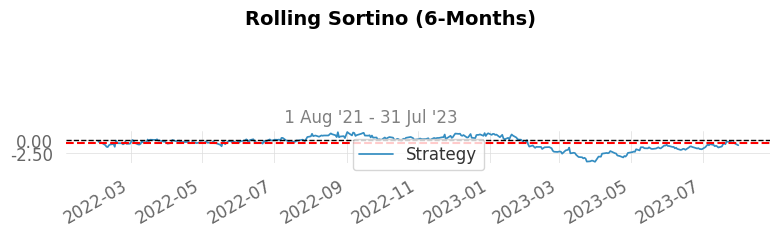

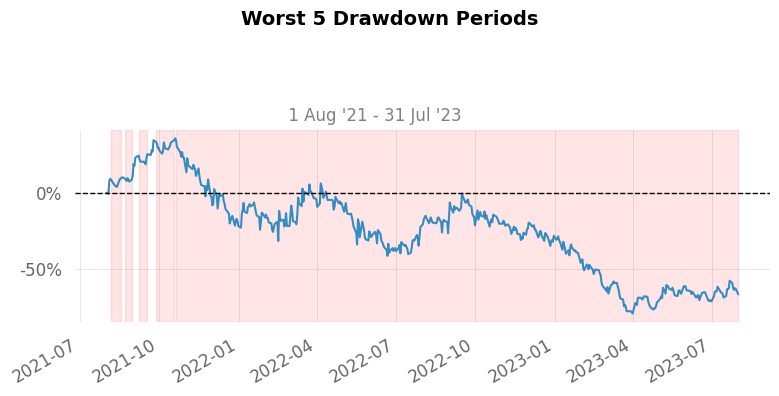

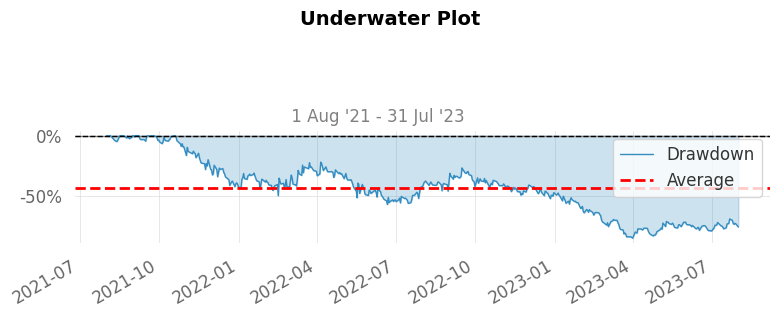

/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/quantstats/stats.py:983: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  returns = returns.pivot('Year', 'Month', 'Returns').fillna(0)


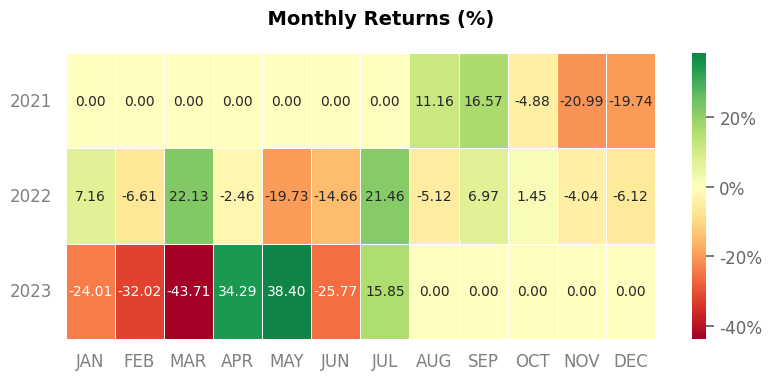

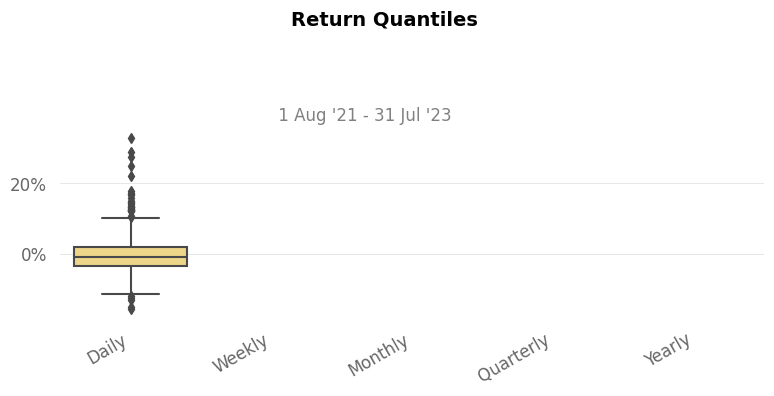

/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/quantstats/stats.py:983: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  returns = returns.pivot('Year', 'Month', 'Returns').fillna(0)


In [19]:
connection.get_backtesting_report_statistics(strategy, report='full', html_dump=True, initial_funds=initial_virtual_funds)

### Order History

In [20]:
order_history = connection.get_backtesting_report_order_history(strategy)
print(order_history)



+------------------------------------+---------------------------+----------------------------------+------+
| INST                               | TIME                      | ID                               | TT   |
|------------------------------------+---------------------------+----------------------------------+------|
| NSE_FO:NIFTY05AUG2115750CE [LOCAL] | 2021-08-01 09:15:00+05:30 | 9b956a78082c4c9fb86a15ce56206e78 | BUY  |
+------------------------------------+---------------------------+----------------------------------+------+
+----+---------------------------+------------------------+-------+
|    | TIME                      | STATE                  | MSG   |
|----+---------------------------+------------------------+-------|
|  0 | 2021-08-01 09:15:00+05:30 | PUT ORDER REQ RECEIVED |       |
|  1 | 2021-08-01 09:15:00+05:30 | VALIDATION PENDING     |       |
|  2 | 2021-08-01 09:15:00+05:30 | OPEN PENDING           |       |
|  3 | 2021-08-01 09:15:00+05:30 | OPEN      

---

## Papertrading

### Start

In [ ]:
connection.papertrade(
    strategy=strategy, 
    start='9:15 +0530', 
    end='15:00 +0530',  
    instruments='NSE:SBIN', 
    lots=5,
    parameters=parameters, 
    candle='1 minute',
)

### Status

In [ ]:
connection.get_papertrading_job_status(strategy)

### Logs

In [ ]:
logs = connection.get_papertrading_logs(strategy)
print(logs)

### Stop

In [ ]:
connection.stop_papertrading_job(strategy)

### Profit and Loss Reports (Paper Trading)

In [ ]:
pnl_reports = connection.get_papertrading_report_pnl_table(strategy)
pnl_reports

### Statistics Reports (Paper Trading)

#### Statistics

In [ ]:
connection.get_papertrading_report_statistics(strategy)

#### Quantstats Full Report

In [ ]:
connection.get_papertrading_report_statistics(strategy, mode='quantstats', report='full', html_dump=True)

### Order History (Paper Trading)

In [ ]:
order_history = connection.get_papertrading_report_order_history(strategy)
print(order_history)

---

## Live Trading (Real Trading)

### Start

In [ ]:
connection.realtrade(
    strategy=strategy, 
    start='8:00 +0530', 
    end='15:00 +0530', 
    instruments='NSE:SBIN', 
    lots=5,
    parameters=parameters, 
    candle='1 minute',
    broking_id=73,
    broking_details=broking_details
)

### Status

In [ ]:
connection.get_realtrading_job_status(strategy)

### Logs

In [ ]:
logs = connection.get_realtrading_logs(strategy)
print(logs)

### Stop

In [ ]:
connection.stop_realtrading_job(strategy)

### Profit and Loss Reports (Live Trading)

In [ ]:
pnl_reports = connection.get_realtrading_report_pnl_table(strategy)
pnl_reports

### Statistics Reports (Live Trading)

#### Statistics

In [ ]:
connection.get_realtrading_report_statistics(strategy)

#### Quantstats Full Report

In [ ]:
connection.get_realtrading_report_statistics(strategy, mode='quantstats', report='full', html_dump=True)